In [1]:
import sys
sys.path.insert(0, "../../")
from classes.calculators.lennardjones import LennardJones
from classes.atom_classes.atom_collection import Atom_Collection
from classes.atom_classes.atom import Atom
from classes.atom_classes.atom_collection_plotter import Atom_Collection_Plotter, Animator
from classes.optimizers.bassin_hopping import Bassin_Hopper_new
import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
plt.rc('animation', html='jshtml')

In [2]:
def random_inits(N, x_min=-4.0, x_max=4.0, y_min=-4.0, y_max=4.0):
    ns = np.random.rand(N,2)
    ns[:,0]*=(x_max-x_min)
    ns[:,0]+=x_min
    ns[:,1]*=(y_max-y_min)
    ns[:,1]+=y_min
    return ns

def create_atom_col(N_atoms, grid_size):
    atom_list = []
    init_pos = random_inits(N=N_atoms-1, x_min=grid_size[0], x_max=grid_size[1], y_min=grid_size[0], y_max=grid_size[1])
    init_pos_fixed = np.array([0.0,0.0])
    new_arr = np.insert(init_pos,0, init_pos_fixed).reshape(N_atoms, 2)
    for pos in new_arr:
        atom = Atom(pos)
        atom_list.append(atom)
    atom_col = Atom_Collection(atomlist=atom_list)
    atom_col.freeze_atoms(indices=[0])
    return atom_col

In [9]:
class Animation(Animator):
    def __init__(self, e_line, default_cols=..., markersize=50, scale_with_mass=False, alpha=1):
        super().__init__(default_cols, markersize, scale_with_mass, alpha)
        self.e_line = e_line
    def animate(self, i, positions, atom_col, axs, pot_es):
        atom_col.set_atom_positions(positions)
        plot_elems = self(atom_col)
        xs = np.linspace(0, i, i)
        self.e_line.set_data(xs, pot_es[0:i])
        #print(plot_elems)
        return plot_elems["atoms"] + [self.e_line]

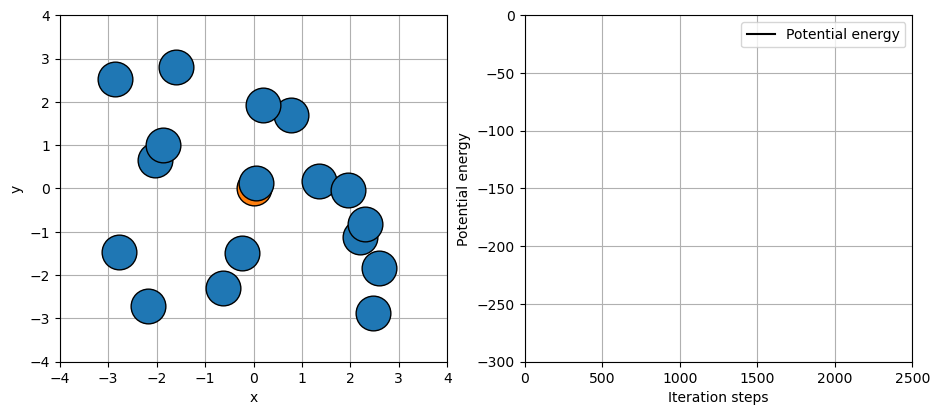

In [10]:
fig, axs = plt.subplots(1,2, figsize=(11,4.5))
axs[0].set_xlim([-4,4])
axs[0].set_ylim([-4,4])
axs[1].set_xlim([0,2500])
axs[1].set_ylim([-300, 00])
axs[0].set_xlabel("x")
axs[0].set_ylabel("y")
for ax in axs:
    ax.grid()
atom_plotter = Atom_Collection_Plotter(markersize=25)
atom_cols = []
N_atoms = 18
atom_col = create_atom_col(N_atoms=N_atoms, grid_size=[-3.0,3.0])
atom_col.calculator = LennardJones()
s = atom_plotter(atom_col=atom_col, ax=axs[0])
e_line = axs[1].plot([],[], ls="-", c="k", label="Potential energy")[0]
axs[1].set_xlabel("Iteration steps")
axs[1].set_ylabel("Potential energy")
axs[1].legend()
#print(atom_col.plot_elems)

In [11]:
optimizer = Bassin_Hopper_new(atom_col=atom_col, T=0.15, N_lin_search=400)
optimizer.run(N_max=50, track=True)

c:\Users\karst\Computational-Physics\Week3\exercise 17\../..\classes\optimizers\bassin_hopping.py:79: RuntimeWarning: overflow encountered in exp
  return np.exp(-(E_new-E_current)/self.T)


In [12]:
#print(atom_col.plot_elems)
positions = [opt_col.positions for opt_col in optimizer.logged_atom_cols]
pot_es = [opt_col.get_potential_energy() for opt_col in optimizer.logged_atom_cols]
animator = Animation(markersize=25, e_line=e_line)
def update(i):
    position = positions[i]
    #print(atom_col.plot_elems)
    plot_elems = animator.animate(i=i,positions=position, atom_col=atom_col, axs=axs, pot_es=pot_es)
    #print(plot_elems)
    return plot_elems

In [13]:
N = len(positions)
print(N)
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, len(positions), 10),
                               interval=75,
                               blit=True)
anim

2500


In [14]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("bassin_hop_fix.gif", writer=writer)

In [ ]:
len(np.arange(0, len(positions), 10))

In [ ]:
len(np.arange(0, len(positions), 20))

In [ ]:
np.arange(0, len(positions), 20)[-50:]